## Configuración inicial

A continuación se importan las librerías necesarias para el funcionamiento del notebook.

In [1]:
#plots and data
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#metrics and transformations
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn import metrics

#Model 
import xgboost as xgb

sns.set()

In [3]:
#function to measure the performance
def timeseries_evaluation_metrics_func(y_true, y_pred,flag):
    def mean_absolute_percentage_error(y_true, y_pred): 
        epsilon=0.1e-5
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    if flag : print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')
    else:
        print('Evaluation metric results:')
        print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
        print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
        print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
        print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
        
    return {"MSE":metrics.mean_squared_error(y_true, y_pred),
           "MAE":metrics.mean_absolute_error(y_true, y_pred),
           "RMSE":np.sqrt(metrics.mean_squared_error(y_true, y_pred)),
           "MAPE":mean_absolute_percentage_error(y_true, y_pred)}

In [4]:
def plot_predict_test(df_test_y,testPredict,lag):
        ### Resultado predicción datos de entrenamiento
    fig, ax = plt.subplots(figsize=[15,8])
    sns.lineplot(df_test_y.flatten(),label="real")
    sns.lineplot(testPredict.flatten(),label="predicción")
    plt.title("Comparación valor real y predicción")
    plt.ylabel("value")

In [5]:
def createLagFeature(name_features,lag,df):
    for name_feature in name_features:
        for i in range(1,lag+1):
            df[name_feature+"lag"+str(i)]=df[name_feature].shift(i)
    return df

---

## Cargar y preparar los datos.

In [2]:
df = pd.read_csv("../../Datasets/Datos_durante_pandemia/data_durante_vol_ic.csv")

df['Fecha'] = pd.to_datetime(df['Fecha'])
df = df.sort_values('Fecha', ascending=True)
df = df.rename(columns = {'Vol. Futuros': 'VolFuturos'})
df

,Fecha,VolFuturos,PI,MHI,FNI,SI
0,2020-01-01,1.289946,0.00,0.00,0.00,0.00
1,2020-01-02,0.735046,0.00,0.00,0.00,0.00
2,2020-01-03,0.591834,0.00,0.00,0.00,0.00
3,2020-01-04,1.367154,0.00,0.00,0.00,0.00
4,2020-01-05,1.505321,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...
913,2022-07-02,0.778572,4.66,25.71,0.19,-3.56
914,2022-07-03,0.819483,0.42,7.76,0.00,-3.67
915,2022-07-04,0.843804,0.54,31.37,0.27,-5.85
916,2022-07-05,0.850985,0.48,38.21,0.12,-4.97


---

## Desarrollo del modelo

In [7]:
#objects to scale the data 
sc=StandardScaler()
sc2=StandardScaler()

In [8]:
df_stats=df

In [9]:
#
len_data=df_stats.shape[0]

#get target
df_label=df_stats["VolFuturos"].values.reshape(len_data,1)
#get attributes
df_data=df_stats.drop(columns=["Fecha"])

#apply scale
#df_label=sc.fit_transform(df_label)
#df_data_normalize=sc2.fit_transform(df_data)


In [10]:
def Model(df_data,df_label,lag,estimators):
    delete_columns=list(df_data.columns)
    df_data_lags=createLagFeature(df_data.columns,lag,df_data) if lag>0 else df_data
    df_data_lags.drop(columns=delete_columns,inplace=True)
    df_data_lags=df_data_lags[lag:]
    #transform data
    df_data_lags=sc2.fit_transform(df_data_lags)
    
    #split data
    #last index of the train data
    seventy_percent=int(len_data*0.7)

    #split the data normalize
    df_train=df_data_lags[:seventy_percent]
    df_test=df_data_lags[seventy_percent:]

    #split labels
    df_label=df_label[lag:]
    df_train_y=df_label[:seventy_percent]
    df_test_y=df_label[seventy_percent:]
    #split labels normalize
    df_label_normalize=sc.fit_transform(df_label)
    df_train_y_normalize=df_label_normalize[:seventy_percent]
    df_test_y_normalize=df_label_normalize[seventy_percent:]
    
   
    #make model
    model=xgb.XGBRegressor(n_estimators=estimators
                        ,early_stopping_rounds=80)
    #fit the model with the train data
    
    history=model.fit(df_train,df_train_y_normalize,
          eval_set=[(df_train,df_train_y_normalize),(df_test,df_test_y_normalize)])
   
    # make predictions
    trainPredict = model.predict(df_train)
    trainPredict = np.reshape(trainPredict,(len(trainPredict),1))
    # invert transformation
    trainPredict = sc.inverse_transform(trainPredict)
    trainY = df_train_y
    
    # make predictions
    testPredict = model.predict(df_test)
    # invert transformation
    testPredict = np.reshape(testPredict,(len(testPredict),1))
    testPredict = sc.inverse_transform(testPredict)
    testY = df_test_y
    print("len test: ",testY.shape)
    print("len PREDICT: ",testPredict.shape)
    
    plot_predict_test(df_train_y,trainPredict,lag)
    plot_predict_test(df_test_y,testPredict,lag)
    return [{"Fecha":df_stats.Fecha[lag:][:seventy_percent],"typeXGBoost":["train"]*len(trainPredict.flatten()),"XGBoost" :trainPredict.flatten()}
            ,{"Fecha":df_stats.Fecha[lag:][seventy_percent:],"typeXGBoost":["test"]*len(testPredict.flatten()),"XGBoost":testPredict.flatten()}]
   
    return {"train":timeseries_evaluation_metrics_func(trainY.flatten()+1, trainPredict.flatten()+1,False),
           "test":timeseries_evaluation_metrics_func(testY.flatten()+1, testPredict.flatten()+1,False)}

## Resultados

[0]	validation_0-rmse:0.97917	validation_1-rmse:0.97733
[1]	validation_0-rmse:0.84246	validation_1-rmse:0.95958
[2]	validation_0-rmse:0.75538	validation_1-rmse:0.96684
[3]	validation_0-rmse:0.67762	validation_1-rmse:0.96518
[4]	validation_0-rmse:0.62310	validation_1-rmse:0.97519
[5]	validation_0-rmse:0.58852	validation_1-rmse:0.97012
[6]	validation_0-rmse:0.54054	validation_1-rmse:0.98522
[7]	validation_0-rmse:0.50093	validation_1-rmse:0.97950
[8]	validation_0-rmse:0.48183	validation_1-rmse:0.97890
[9]	validation_0-rmse:0.46076	validation_1-rmse:0.97758
[10]	validation_0-rmse:0.44014	validation_1-rmse:0.98004
[11]	validation_0-rmse:0.40557	validation_1-rmse:0.99271
[12]	validation_0-rmse:0.38686	validation_1-rmse:0.99106
[13]	validation_0-rmse:0.37970	validation_1-rmse:0.99253
[14]	validation_0-rmse:0.34869	validation_1-rmse:0.99576
[15]	validation_0-rmse:0.33796	validation_1-rmse:0.99790
[16]	validation_0-rmse:0.30421	validation_1-rmse:0.99873
[17]	validation_0-rmse:0.29687	validation

[23]	validation_0-rmse:0.23036	validation_1-rmse:1.01477
[24]	validation_0-rmse:0.21719	validation_1-rmse:1.01441
[25]	validation_0-rmse:0.20944	validation_1-rmse:1.01272
[26]	validation_0-rmse:0.19674	validation_1-rmse:1.01515
[27]	validation_0-rmse:0.18252	validation_1-rmse:1.01490
[28]	validation_0-rmse:0.17125	validation_1-rmse:1.01327
[29]	validation_0-rmse:0.16614	validation_1-rmse:1.01226
[30]	validation_0-rmse:0.15844	validation_1-rmse:1.01305
[31]	validation_0-rmse:0.15347	validation_1-rmse:1.01604
[32]	validation_0-rmse:0.14766	validation_1-rmse:1.01723
[33]	validation_0-rmse:0.13529	validation_1-rmse:1.01666
[34]	validation_0-rmse:0.13134	validation_1-rmse:1.01653
[35]	validation_0-rmse:0.12047	validation_1-rmse:1.01768
[36]	validation_0-rmse:0.11306	validation_1-rmse:1.02032
[37]	validation_0-rmse:0.10945	validation_1-rmse:1.02020
[38]	validation_0-rmse:0.10557	validation_1-rmse:1.02034
[39]	validation_0-rmse:0.10184	validation_1-rmse:1.02051
[40]	validation_0-rmse:0.09678	

[6]	validation_0-rmse:0.54054	validation_1-rmse:0.98522
[7]	validation_0-rmse:0.50093	validation_1-rmse:0.97950
[8]	validation_0-rmse:0.48183	validation_1-rmse:0.97890
[9]	validation_0-rmse:0.46076	validation_1-rmse:0.97758
[10]	validation_0-rmse:0.44014	validation_1-rmse:0.98004
[11]	validation_0-rmse:0.40557	validation_1-rmse:0.99271
[12]	validation_0-rmse:0.38686	validation_1-rmse:0.99106
[13]	validation_0-rmse:0.37970	validation_1-rmse:0.99253
[14]	validation_0-rmse:0.34869	validation_1-rmse:0.99576
[15]	validation_0-rmse:0.33796	validation_1-rmse:0.99790
[16]	validation_0-rmse:0.30421	validation_1-rmse:0.99873
[17]	validation_0-rmse:0.29687	validation_1-rmse:0.99585
[18]	validation_0-rmse:0.28641	validation_1-rmse:1.00368
[19]	validation_0-rmse:0.27329	validation_1-rmse:1.00610
[20]	validation_0-rmse:0.24730	validation_1-rmse:1.00647
[21]	validation_0-rmse:0.24252	validation_1-rmse:1.00632
[22]	validation_0-rmse:0.23973	validation_1-rmse:1.00914
[23]	validation_0-rmse:0.23036	vali

[64]	validation_0-rmse:0.02982	validation_1-rmse:1.02128
[65]	validation_0-rmse:0.02857	validation_1-rmse:1.02112
[66]	validation_0-rmse:0.02719	validation_1-rmse:1.02120
[67]	validation_0-rmse:0.02663	validation_1-rmse:1.02121
[68]	validation_0-rmse:0.02506	validation_1-rmse:1.02139
[69]	validation_0-rmse:0.02337	validation_1-rmse:1.02108
[70]	validation_0-rmse:0.02209	validation_1-rmse:1.02091
[71]	validation_0-rmse:0.02153	validation_1-rmse:1.02103
[72]	validation_0-rmse:0.01995	validation_1-rmse:1.02110
[73]	validation_0-rmse:0.01867	validation_1-rmse:1.02125
[74]	validation_0-rmse:0.01776	validation_1-rmse:1.02133
[75]	validation_0-rmse:0.01723	validation_1-rmse:1.02123
[76]	validation_0-rmse:0.01693	validation_1-rmse:1.02136
[77]	validation_0-rmse:0.01609	validation_1-rmse:1.02139
[78]	validation_0-rmse:0.01477	validation_1-rmse:1.02116
[79]	validation_0-rmse:0.01378	validation_1-rmse:1.02113
[80]	validation_0-rmse:0.01332	validation_1-rmse:1.02108
[81]	validation_0-rmse:0.01313	

[33]	validation_0-rmse:0.13529	validation_1-rmse:1.01666
[34]	validation_0-rmse:0.13134	validation_1-rmse:1.01653
[35]	validation_0-rmse:0.12047	validation_1-rmse:1.01768
[36]	validation_0-rmse:0.11306	validation_1-rmse:1.02032
[37]	validation_0-rmse:0.10945	validation_1-rmse:1.02020
[38]	validation_0-rmse:0.10557	validation_1-rmse:1.02034
[39]	validation_0-rmse:0.10184	validation_1-rmse:1.02051
[40]	validation_0-rmse:0.09678	validation_1-rmse:1.01995
[41]	validation_0-rmse:0.09112	validation_1-rmse:1.01974
[42]	validation_0-rmse:0.08627	validation_1-rmse:1.02021
[43]	validation_0-rmse:0.08169	validation_1-rmse:1.01989
[44]	validation_0-rmse:0.08066	validation_1-rmse:1.02030
[45]	validation_0-rmse:0.07804	validation_1-rmse:1.02034
[46]	validation_0-rmse:0.07468	validation_1-rmse:1.02041
[47]	validation_0-rmse:0.07099	validation_1-rmse:1.02038
[48]	validation_0-rmse:0.06703	validation_1-rmse:1.02109
[49]	validation_0-rmse:0.06450	validation_1-rmse:1.02073
[50]	validation_0-rmse:0.06104	

[34]	validation_0-rmse:0.10167	validation_1-rmse:1.01759
[35]	validation_0-rmse:0.09641	validation_1-rmse:1.01966
[36]	validation_0-rmse:0.09113	validation_1-rmse:1.01987
[37]	validation_0-rmse:0.08581	validation_1-rmse:1.02043
[38]	validation_0-rmse:0.08253	validation_1-rmse:1.02007
[39]	validation_0-rmse:0.08061	validation_1-rmse:1.01805
[40]	validation_0-rmse:0.07892	validation_1-rmse:1.01822
[41]	validation_0-rmse:0.07345	validation_1-rmse:1.01841
[42]	validation_0-rmse:0.07064	validation_1-rmse:1.01817
[43]	validation_0-rmse:0.06686	validation_1-rmse:1.01859
[44]	validation_0-rmse:0.06212	validation_1-rmse:1.01902
[45]	validation_0-rmse:0.05810	validation_1-rmse:1.01991
[46]	validation_0-rmse:0.05454	validation_1-rmse:1.02049
[47]	validation_0-rmse:0.05164	validation_1-rmse:1.02068
[48]	validation_0-rmse:0.04997	validation_1-rmse:1.02049
[49]	validation_0-rmse:0.04758	validation_1-rmse:1.02047
[50]	validation_0-rmse:0.04501	validation_1-rmse:1.02072
[51]	validation_0-rmse:0.04155	

<ipython-input-4-f7487097fa4e>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=[15,8])


Evaluation metric results:
MSE is : 0.7763337090733514
MAE is : 0.7077604442359413
RMSE is : 0.8810980133182411
MAPE is : 38.22301428369072
Evaluation metric results:
MSE is : 1.4344922687288404
MAE is : 0.9168633290564964
RMSE is : 1.1977029133841333
MAPE is : 47.59304681955512
[0]	validation_0-rmse:0.96235	validation_1-rmse:0.98886
[1]	validation_0-rmse:0.84794	validation_1-rmse:0.96073
[2]	validation_0-rmse:0.76800	validation_1-rmse:0.96053
[3]	validation_0-rmse:0.70355	validation_1-rmse:0.95952
[4]	validation_0-rmse:0.62369	validation_1-rmse:0.96567
[5]	validation_0-rmse:0.56313	validation_1-rmse:0.97009
[6]	validation_0-rmse:0.53803	validation_1-rmse:0.97258
[7]	validation_0-rmse:0.49040	validation_1-rmse:0.97378
[8]	validation_0-rmse:0.43735	validation_1-rmse:0.97705
[9]	validation_0-rmse:0.41539	validation_1-rmse:0.97619
[10]	validation_0-rmse:0.37436	validation_1-rmse:0.99117
[11]	validation_0-rmse:0.34387	validation_1-rmse:0.99721
[12]	validation_0-rmse:0.32304	validation_1-rm

[54]	validation_0-rmse:0.03689	validation_1-rmse:1.02131
[55]	validation_0-rmse:0.03544	validation_1-rmse:1.02148
[56]	validation_0-rmse:0.03410	validation_1-rmse:1.02164
[57]	validation_0-rmse:0.03259	validation_1-rmse:1.02163
[58]	validation_0-rmse:0.03147	validation_1-rmse:1.02116
[59]	validation_0-rmse:0.02961	validation_1-rmse:1.02098
[60]	validation_0-rmse:0.02922	validation_1-rmse:1.02101
[61]	validation_0-rmse:0.02863	validation_1-rmse:1.02100
[62]	validation_0-rmse:0.02689	validation_1-rmse:1.02091
[63]	validation_0-rmse:0.02603	validation_1-rmse:1.02090
[64]	validation_0-rmse:0.02512	validation_1-rmse:1.02100
[65]	validation_0-rmse:0.02395	validation_1-rmse:1.02157
[66]	validation_0-rmse:0.02290	validation_1-rmse:1.02134
[67]	validation_0-rmse:0.02247	validation_1-rmse:1.02133
[68]	validation_0-rmse:0.02124	validation_1-rmse:1.02146
[69]	validation_0-rmse:0.01984	validation_1-rmse:1.02143
[70]	validation_0-rmse:0.01922	validation_1-rmse:1.02119
[71]	validation_0-rmse:0.01807	

[20]	validation_0-rmse:0.21648	validation_1-rmse:1.01240
[21]	validation_0-rmse:0.20708	validation_1-rmse:1.01363
[22]	validation_0-rmse:0.20116	validation_1-rmse:1.01379
[23]	validation_0-rmse:0.18694	validation_1-rmse:1.01441
[24]	validation_0-rmse:0.17526	validation_1-rmse:1.01328
[25]	validation_0-rmse:0.17122	validation_1-rmse:1.01321
[26]	validation_0-rmse:0.16479	validation_1-rmse:1.01227
[27]	validation_0-rmse:0.15120	validation_1-rmse:1.01279
[28]	validation_0-rmse:0.14413	validation_1-rmse:1.01454
[29]	validation_0-rmse:0.14034	validation_1-rmse:1.01409
[30]	validation_0-rmse:0.13164	validation_1-rmse:1.01307
[31]	validation_0-rmse:0.12255	validation_1-rmse:1.01500
[32]	validation_0-rmse:0.11691	validation_1-rmse:1.01411
[33]	validation_0-rmse:0.11245	validation_1-rmse:1.01479
[34]	validation_0-rmse:0.10167	validation_1-rmse:1.01759
[35]	validation_0-rmse:0.09641	validation_1-rmse:1.01966
[36]	validation_0-rmse:0.09113	validation_1-rmse:1.01987
[37]	validation_0-rmse:0.08581	

[76]	validation_0-rmse:0.01555	validation_1-rmse:1.02128
[77]	validation_0-rmse:0.01484	validation_1-rmse:1.02118
[78]	validation_0-rmse:0.01415	validation_1-rmse:1.02121
[79]	validation_0-rmse:0.01309	validation_1-rmse:1.02130
[80]	validation_0-rmse:0.01249	validation_1-rmse:1.02142
[81]	validation_0-rmse:0.01158	validation_1-rmse:1.02141
[82]	validation_0-rmse:0.01130	validation_1-rmse:1.02142
[83]	validation_0-rmse:0.01091	validation_1-rmse:1.02148
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 0.7763337090733514
MAE is : 0.7077604442359413
RMSE is : 0.8810980133182411
MAPE is : 38.22301428369072
Evaluation metric results:
MSE is : 1.4344922687288404
MAE is : 0.9168633290564964
RMSE is : 1.1977029133841333
MAPE is : 47.59304681955512
[0]	validation_0-rmse:0.96295	validation_1-rmse:0.97219
[1]	validation_0-rmse:0.83520	validation_1-rmse:0.95636
[2]	validation_0-rmse:0.73331	validation_1-rmse:0.94384
[3]	validation_0-rmse:0.66098	validation_1-rmse:0.954

[10]	validation_0-rmse:0.36267	validation_1-rmse:1.01365
[11]	validation_0-rmse:0.35067	validation_1-rmse:1.01456
[12]	validation_0-rmse:0.31315	validation_1-rmse:1.01602
[13]	validation_0-rmse:0.29173	validation_1-rmse:1.01925
[14]	validation_0-rmse:0.27708	validation_1-rmse:1.01903
[15]	validation_0-rmse:0.26047	validation_1-rmse:1.01455
[16]	validation_0-rmse:0.23534	validation_1-rmse:1.01476
[17]	validation_0-rmse:0.21719	validation_1-rmse:1.01172
[18]	validation_0-rmse:0.19511	validation_1-rmse:1.01409
[19]	validation_0-rmse:0.18931	validation_1-rmse:1.01359
[20]	validation_0-rmse:0.17683	validation_1-rmse:1.01770
[21]	validation_0-rmse:0.16620	validation_1-rmse:1.02184
[22]	validation_0-rmse:0.15732	validation_1-rmse:1.02064
[23]	validation_0-rmse:0.14151	validation_1-rmse:1.02300
[24]	validation_0-rmse:0.13363	validation_1-rmse:1.02241
[25]	validation_0-rmse:0.12967	validation_1-rmse:1.02302
[26]	validation_0-rmse:0.12656	validation_1-rmse:1.02321
[27]	validation_0-rmse:0.12143	

[79]	validation_0-rmse:0.00576	validation_1-rmse:1.03085
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 0.8422351954466258
MAE is : 0.7438393044143629
RMSE is : 0.9177337279661383
MAPE is : 40.92222967458563
Evaluation metric results:
MSE is : 1.3879877166895633
MAE is : 0.9160247022411907
RMSE is : 1.1781289049546162
MAPE is : 48.35165960242795
[0]	validation_0-rmse:0.96295	validation_1-rmse:0.97219
[1]	validation_0-rmse:0.83520	validation_1-rmse:0.95636
[2]	validation_0-rmse:0.73331	validation_1-rmse:0.94384
[3]	validation_0-rmse:0.66098	validation_1-rmse:0.95441
[4]	validation_0-rmse:0.61757	validation_1-rmse:0.95599
[5]	validation_0-rmse:0.54435	validation_1-rmse:0.98350
[6]	validation_0-rmse:0.51659	validation_1-rmse:0.98670
[7]	validation_0-rmse:0.47656	validation_1-rmse:0.99147
[8]	validation_0-rmse:0.45141	validation_1-rmse:0.99148
[9]	validation_0-rmse:0.40975	validation_1-rmse:1.00178
[10]	validation_0-rmse:0.36267	validation_1-rmse:1.01365
[11

[50]	validation_0-rmse:0.03045	validation_1-rmse:1.02994
[51]	validation_0-rmse:0.02808	validation_1-rmse:1.03055
[52]	validation_0-rmse:0.02715	validation_1-rmse:1.03093
[53]	validation_0-rmse:0.02520	validation_1-rmse:1.03115
[54]	validation_0-rmse:0.02412	validation_1-rmse:1.03118
[55]	validation_0-rmse:0.02330	validation_1-rmse:1.03122
[56]	validation_0-rmse:0.02286	validation_1-rmse:1.03123
[57]	validation_0-rmse:0.02140	validation_1-rmse:1.03105
[58]	validation_0-rmse:0.01954	validation_1-rmse:1.03101
[59]	validation_0-rmse:0.01839	validation_1-rmse:1.03082
[60]	validation_0-rmse:0.01674	validation_1-rmse:1.03097
[61]	validation_0-rmse:0.01538	validation_1-rmse:1.03114
[62]	validation_0-rmse:0.01421	validation_1-rmse:1.03094
[63]	validation_0-rmse:0.01385	validation_1-rmse:1.03089
[64]	validation_0-rmse:0.01316	validation_1-rmse:1.03082
[65]	validation_0-rmse:0.01218	validation_1-rmse:1.03076
[66]	validation_0-rmse:0.01203	validation_1-rmse:1.03087
[67]	validation_0-rmse:0.01133	

[18]	validation_0-rmse:0.19511	validation_1-rmse:1.01409
[19]	validation_0-rmse:0.18931	validation_1-rmse:1.01359
[20]	validation_0-rmse:0.17683	validation_1-rmse:1.01770
[21]	validation_0-rmse:0.16620	validation_1-rmse:1.02184
[22]	validation_0-rmse:0.15732	validation_1-rmse:1.02064
[23]	validation_0-rmse:0.14151	validation_1-rmse:1.02300
[24]	validation_0-rmse:0.13363	validation_1-rmse:1.02241
[25]	validation_0-rmse:0.12967	validation_1-rmse:1.02302
[26]	validation_0-rmse:0.12656	validation_1-rmse:1.02321
[27]	validation_0-rmse:0.12143	validation_1-rmse:1.02473
[28]	validation_0-rmse:0.11362	validation_1-rmse:1.02528
[29]	validation_0-rmse:0.10835	validation_1-rmse:1.02493
[30]	validation_0-rmse:0.10009	validation_1-rmse:1.02533
[31]	validation_0-rmse:0.09601	validation_1-rmse:1.02633
[32]	validation_0-rmse:0.09000	validation_1-rmse:1.02680
[33]	validation_0-rmse:0.08493	validation_1-rmse:1.02557
[34]	validation_0-rmse:0.07566	validation_1-rmse:1.02653
[35]	validation_0-rmse:0.06857	

[18]	validation_0-rmse:0.20922	validation_1-rmse:1.01556
[19]	validation_0-rmse:0.19873	validation_1-rmse:1.01506
[20]	validation_0-rmse:0.19057	validation_1-rmse:1.01749
[21]	validation_0-rmse:0.18247	validation_1-rmse:1.01934
[22]	validation_0-rmse:0.17033	validation_1-rmse:1.02014
[23]	validation_0-rmse:0.16067	validation_1-rmse:1.02057
[24]	validation_0-rmse:0.14998	validation_1-rmse:1.02056
[25]	validation_0-rmse:0.14679	validation_1-rmse:1.02096
[26]	validation_0-rmse:0.14189	validation_1-rmse:1.02135
[27]	validation_0-rmse:0.13110	validation_1-rmse:1.02193
[28]	validation_0-rmse:0.12017	validation_1-rmse:1.02315
[29]	validation_0-rmse:0.11460	validation_1-rmse:1.02416
[30]	validation_0-rmse:0.10695	validation_1-rmse:1.02502
[31]	validation_0-rmse:0.10404	validation_1-rmse:1.02452
[32]	validation_0-rmse:0.09812	validation_1-rmse:1.02386
[33]	validation_0-rmse:0.09382	validation_1-rmse:1.02333
[34]	validation_0-rmse:0.08958	validation_1-rmse:1.02381
[35]	validation_0-rmse:0.08496	

[21]	validation_0-rmse:0.18247	validation_1-rmse:1.01934
[22]	validation_0-rmse:0.17033	validation_1-rmse:1.02014
[23]	validation_0-rmse:0.16067	validation_1-rmse:1.02057
[24]	validation_0-rmse:0.14998	validation_1-rmse:1.02056
[25]	validation_0-rmse:0.14679	validation_1-rmse:1.02096
[26]	validation_0-rmse:0.14189	validation_1-rmse:1.02135
[27]	validation_0-rmse:0.13110	validation_1-rmse:1.02193
[28]	validation_0-rmse:0.12017	validation_1-rmse:1.02315
[29]	validation_0-rmse:0.11460	validation_1-rmse:1.02416
[30]	validation_0-rmse:0.10695	validation_1-rmse:1.02502
[31]	validation_0-rmse:0.10404	validation_1-rmse:1.02452
[32]	validation_0-rmse:0.09812	validation_1-rmse:1.02386
[33]	validation_0-rmse:0.09382	validation_1-rmse:1.02333
[34]	validation_0-rmse:0.08958	validation_1-rmse:1.02381
[35]	validation_0-rmse:0.08496	validation_1-rmse:1.02518
[36]	validation_0-rmse:0.07930	validation_1-rmse:1.02536
[37]	validation_0-rmse:0.07670	validation_1-rmse:1.02507
[38]	validation_0-rmse:0.07004	

[80]	validation_0-rmse:0.00613	validation_1-rmse:1.02974
[81]	validation_0-rmse:0.00582	validation_1-rmse:1.02968
[82]	validation_0-rmse:0.00555	validation_1-rmse:1.02964
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 0.9635969926248552
MAE is : 0.7855467375151935
RMSE is : 0.9816297635182295
MAPE is : 42.691640814634766
Evaluation metric results:
MSE is : 1.379000480232402
MAE is : 0.9196735869896742
RMSE is : 1.1743085115217389
MAPE is : 48.08648704325032
[0]	validation_0-rmse:0.98506	validation_1-rmse:0.97962
[1]	validation_0-rmse:0.87636	validation_1-rmse:0.94611
[2]	validation_0-rmse:0.78400	validation_1-rmse:0.94077
[3]	validation_0-rmse:0.68620	validation_1-rmse:0.95629
[4]	validation_0-rmse:0.64641	validation_1-rmse:0.96235
[5]	validation_0-rmse:0.57936	validation_1-rmse:0.99404
[6]	validation_0-rmse:0.51187	validation_1-rmse:0.99781
[7]	validation_0-rmse:0.46438	validation_1-rmse:1.00346
[8]	validation_0-rmse:0.44334	validation_1-rmse:1.00411
[9

[47]	validation_0-rmse:0.03872	validation_1-rmse:1.02838
[48]	validation_0-rmse:0.03731	validation_1-rmse:1.02869
[49]	validation_0-rmse:0.03587	validation_1-rmse:1.02867
[50]	validation_0-rmse:0.03458	validation_1-rmse:1.02859
[51]	validation_0-rmse:0.03232	validation_1-rmse:1.02877
[52]	validation_0-rmse:0.03050	validation_1-rmse:1.02867
[53]	validation_0-rmse:0.02907	validation_1-rmse:1.02949
[54]	validation_0-rmse:0.02771	validation_1-rmse:1.02949
[55]	validation_0-rmse:0.02675	validation_1-rmse:1.02958
[56]	validation_0-rmse:0.02455	validation_1-rmse:1.02916
[57]	validation_0-rmse:0.02302	validation_1-rmse:1.02909
[58]	validation_0-rmse:0.02230	validation_1-rmse:1.02919
[59]	validation_0-rmse:0.02106	validation_1-rmse:1.02937
[60]	validation_0-rmse:0.02004	validation_1-rmse:1.02932
[61]	validation_0-rmse:0.01901	validation_1-rmse:1.02920
[62]	validation_0-rmse:0.01782	validation_1-rmse:1.02927
[63]	validation_0-rmse:0.01652	validation_1-rmse:1.02915
[64]	validation_0-rmse:0.01554	

[15]	validation_0-rmse:0.26069	validation_1-rmse:1.02044
[16]	validation_0-rmse:0.24869	validation_1-rmse:1.02266
[17]	validation_0-rmse:0.23249	validation_1-rmse:1.02422
[18]	validation_0-rmse:0.22404	validation_1-rmse:1.02593
[19]	validation_0-rmse:0.21071	validation_1-rmse:1.03238
[20]	validation_0-rmse:0.20091	validation_1-rmse:1.03124
[21]	validation_0-rmse:0.18837	validation_1-rmse:1.03139
[22]	validation_0-rmse:0.18197	validation_1-rmse:1.03133
[23]	validation_0-rmse:0.17277	validation_1-rmse:1.03109
[24]	validation_0-rmse:0.16204	validation_1-rmse:1.03200
[25]	validation_0-rmse:0.15604	validation_1-rmse:1.03152
[26]	validation_0-rmse:0.14026	validation_1-rmse:1.03113
[27]	validation_0-rmse:0.13135	validation_1-rmse:1.03163
[28]	validation_0-rmse:0.12248	validation_1-rmse:1.03333
[29]	validation_0-rmse:0.10675	validation_1-rmse:1.03186
[30]	validation_0-rmse:0.10223	validation_1-rmse:1.03142
[31]	validation_0-rmse:0.09887	validation_1-rmse:1.03152
[32]	validation_0-rmse:0.08959	

[38]	validation_0-rmse:0.06291	validation_1-rmse:1.03371
[39]	validation_0-rmse:0.06050	validation_1-rmse:1.03399
[40]	validation_0-rmse:0.05745	validation_1-rmse:1.03413
[41]	validation_0-rmse:0.05400	validation_1-rmse:1.03487
[42]	validation_0-rmse:0.05082	validation_1-rmse:1.03486
[43]	validation_0-rmse:0.04657	validation_1-rmse:1.03598
[44]	validation_0-rmse:0.04432	validation_1-rmse:1.03648
[45]	validation_0-rmse:0.04336	validation_1-rmse:1.03658
[46]	validation_0-rmse:0.03990	validation_1-rmse:1.03659
[47]	validation_0-rmse:0.03751	validation_1-rmse:1.03631
[48]	validation_0-rmse:0.03543	validation_1-rmse:1.03639
[49]	validation_0-rmse:0.03376	validation_1-rmse:1.03666
[50]	validation_0-rmse:0.03241	validation_1-rmse:1.03691
[51]	validation_0-rmse:0.03066	validation_1-rmse:1.03689
[52]	validation_0-rmse:0.02904	validation_1-rmse:1.03699
[53]	validation_0-rmse:0.02786	validation_1-rmse:1.03735
[54]	validation_0-rmse:0.02721	validation_1-rmse:1.03754
[55]	validation_0-rmse:0.02477	

[21]	validation_0-rmse:0.18837	validation_1-rmse:1.03139
[22]	validation_0-rmse:0.18197	validation_1-rmse:1.03133
[23]	validation_0-rmse:0.17277	validation_1-rmse:1.03109
[24]	validation_0-rmse:0.16204	validation_1-rmse:1.03200
[25]	validation_0-rmse:0.15604	validation_1-rmse:1.03152
[26]	validation_0-rmse:0.14026	validation_1-rmse:1.03113
[27]	validation_0-rmse:0.13135	validation_1-rmse:1.03163
[28]	validation_0-rmse:0.12248	validation_1-rmse:1.03333
[29]	validation_0-rmse:0.10675	validation_1-rmse:1.03186
[30]	validation_0-rmse:0.10223	validation_1-rmse:1.03142
[31]	validation_0-rmse:0.09887	validation_1-rmse:1.03152
[32]	validation_0-rmse:0.08959	validation_1-rmse:1.03135
[33]	validation_0-rmse:0.08560	validation_1-rmse:1.03208
[34]	validation_0-rmse:0.08240	validation_1-rmse:1.03220
[35]	validation_0-rmse:0.07711	validation_1-rmse:1.03232
[36]	validation_0-rmse:0.07534	validation_1-rmse:1.03211
[37]	validation_0-rmse:0.07204	validation_1-rmse:1.03187
[38]	validation_0-rmse:0.06291	

[79]	validation_0-rmse:0.00559	validation_1-rmse:1.03848
[80]	validation_0-rmse:0.00524	validation_1-rmse:1.03852
[81]	validation_0-rmse:0.00504	validation_1-rmse:1.03854
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.191801884120074
MAE is : 0.8797944060277398
RMSE is : 1.091696791293294
MAPE is : 48.70786397402391
Evaluation metric results:
MSE is : 1.4306577190773235
MAE is : 0.9524147127297138
RMSE is : 1.1961010488572124
MAPE is : 51.56133521573524
[0]	validation_0-rmse:0.98295	validation_1-rmse:0.99274
[1]	validation_0-rmse:0.87086	validation_1-rmse:0.95823
[2]	validation_0-rmse:0.77457	validation_1-rmse:0.96246
[3]	validation_0-rmse:0.67131	validation_1-rmse:0.97129
[4]	validation_0-rmse:0.63439	validation_1-rmse:0.97278
[5]	validation_0-rmse:0.58401	validation_1-rmse:0.98051
[6]	validation_0-rmse:0.52283	validation_1-rmse:0.99526
[7]	validation_0-rmse:0.47843	validation_1-rmse:0.99872
[8]	validation_0-rmse:0.43602	validation_1-rmse:1.00182
[9]	

[48]	validation_0-rmse:0.03543	validation_1-rmse:1.03639
[49]	validation_0-rmse:0.03376	validation_1-rmse:1.03666
[50]	validation_0-rmse:0.03241	validation_1-rmse:1.03691
[51]	validation_0-rmse:0.03066	validation_1-rmse:1.03689
[52]	validation_0-rmse:0.02904	validation_1-rmse:1.03699
[53]	validation_0-rmse:0.02786	validation_1-rmse:1.03735
[54]	validation_0-rmse:0.02721	validation_1-rmse:1.03754
[55]	validation_0-rmse:0.02477	validation_1-rmse:1.03769
[56]	validation_0-rmse:0.02399	validation_1-rmse:1.03751
[57]	validation_0-rmse:0.02310	validation_1-rmse:1.03768
[58]	validation_0-rmse:0.02194	validation_1-rmse:1.03771
[59]	validation_0-rmse:0.02110	validation_1-rmse:1.03751
[60]	validation_0-rmse:0.02007	validation_1-rmse:1.03751
[61]	validation_0-rmse:0.01877	validation_1-rmse:1.03730
[62]	validation_0-rmse:0.01739	validation_1-rmse:1.03751
[63]	validation_0-rmse:0.01572	validation_1-rmse:1.03752
[64]	validation_0-rmse:0.01430	validation_1-rmse:1.03800
[65]	validation_0-rmse:0.01360	

[49]	validation_0-rmse:0.02278	validation_1-rmse:1.03394
[50]	validation_0-rmse:0.02145	validation_1-rmse:1.03402
[51]	validation_0-rmse:0.02039	validation_1-rmse:1.03411
[52]	validation_0-rmse:0.01928	validation_1-rmse:1.03425
[53]	validation_0-rmse:0.01756	validation_1-rmse:1.03458
[54]	validation_0-rmse:0.01729	validation_1-rmse:1.03450
[55]	validation_0-rmse:0.01633	validation_1-rmse:1.03458
[56]	validation_0-rmse:0.01464	validation_1-rmse:1.03455
[57]	validation_0-rmse:0.01355	validation_1-rmse:1.03459
[58]	validation_0-rmse:0.01235	validation_1-rmse:1.03477
[59]	validation_0-rmse:0.01201	validation_1-rmse:1.03476
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 0.7969276563351296
MAE is : 0.7116438620190194
RMSE is : 0.8927080465276034
MAPE is : 38.19298441834101
Evaluation metric results:
MSE is : 1.5039594097880375
MAE is : 0.9554215228533639
RMSE is : 1.2263602283945927
MAPE is : 50.04286432876235
[0]	validation_0-rmse:0.99003	validation_1-rmse:0.

[52]	validation_0-rmse:0.01928	validation_1-rmse:1.03425
[53]	validation_0-rmse:0.01756	validation_1-rmse:1.03458
[54]	validation_0-rmse:0.01729	validation_1-rmse:1.03450
[55]	validation_0-rmse:0.01633	validation_1-rmse:1.03458
[56]	validation_0-rmse:0.01464	validation_1-rmse:1.03455
[57]	validation_0-rmse:0.01355	validation_1-rmse:1.03459
[58]	validation_0-rmse:0.01235	validation_1-rmse:1.03477
[59]	validation_0-rmse:0.01201	validation_1-rmse:1.03476
[60]	validation_0-rmse:0.01049	validation_1-rmse:1.03454
[61]	validation_0-rmse:0.01000	validation_1-rmse:1.03445
[62]	validation_0-rmse:0.00911	validation_1-rmse:1.03459
[63]	validation_0-rmse:0.00840	validation_1-rmse:1.03454
[64]	validation_0-rmse:0.00780	validation_1-rmse:1.03451
[65]	validation_0-rmse:0.00726	validation_1-rmse:1.03452
[66]	validation_0-rmse:0.00679	validation_1-rmse:1.03452
[67]	validation_0-rmse:0.00609	validation_1-rmse:1.03456
[68]	validation_0-rmse:0.00553	validation_1-rmse:1.03458
[69]	validation_0-rmse:0.00526	

[21]	validation_0-rmse:0.12795	validation_1-rmse:1.02335
[22]	validation_0-rmse:0.12083	validation_1-rmse:1.02732
[23]	validation_0-rmse:0.11728	validation_1-rmse:1.02723
[24]	validation_0-rmse:0.11156	validation_1-rmse:1.02720
[25]	validation_0-rmse:0.09740	validation_1-rmse:1.02805
[26]	validation_0-rmse:0.09340	validation_1-rmse:1.02859
[27]	validation_0-rmse:0.08687	validation_1-rmse:1.02833
[28]	validation_0-rmse:0.08173	validation_1-rmse:1.02950
[29]	validation_0-rmse:0.07945	validation_1-rmse:1.02937
[30]	validation_0-rmse:0.07100	validation_1-rmse:1.03095
[31]	validation_0-rmse:0.06360	validation_1-rmse:1.03204
[32]	validation_0-rmse:0.05950	validation_1-rmse:1.03188
[33]	validation_0-rmse:0.05676	validation_1-rmse:1.03157
[34]	validation_0-rmse:0.05242	validation_1-rmse:1.03228
[35]	validation_0-rmse:0.05033	validation_1-rmse:1.03255
[36]	validation_0-rmse:0.04894	validation_1-rmse:1.03292
[37]	validation_0-rmse:0.04666	validation_1-rmse:1.03303
[38]	validation_0-rmse:0.04394	

[77]	validation_0-rmse:0.00320	validation_1-rmse:1.03472
[78]	validation_0-rmse:0.00293	validation_1-rmse:1.03472
[79]	validation_0-rmse:0.00285	validation_1-rmse:1.03473
[80]	validation_0-rmse:0.00272	validation_1-rmse:1.03472
[81]	validation_0-rmse:0.00265	validation_1-rmse:1.03474
[82]	validation_0-rmse:0.00257	validation_1-rmse:1.03477
[83]	validation_0-rmse:0.00230	validation_1-rmse:1.03479
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 0.7969276563351296
MAE is : 0.7116438620190194
RMSE is : 0.8927080465276034
MAPE is : 38.19298441834101
Evaluation metric results:
MSE is : 1.5039594097880375
MAE is : 0.9554215228533639
RMSE is : 1.2263602283945927
MAPE is : 50.04286432876235
[0]	validation_0-rmse:0.99003	validation_1-rmse:0.98768
[1]	validation_0-rmse:0.87649	validation_1-rmse:0.98635
[2]	validation_0-rmse:0.76918	validation_1-rmse:0.98894
[3]	validation_0-rmse:0.71163	validation_1-rmse:0.98248
[4]	validation_0-rmse:0.61841	validation_1-rmse:0.9935

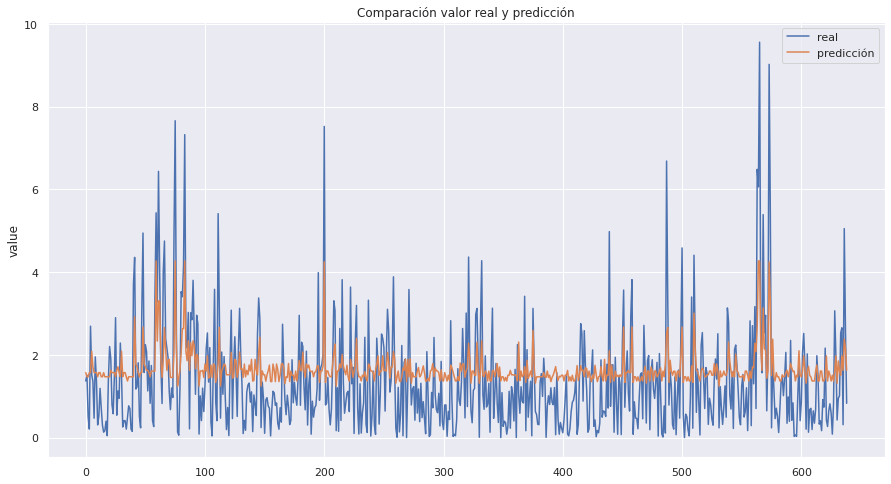

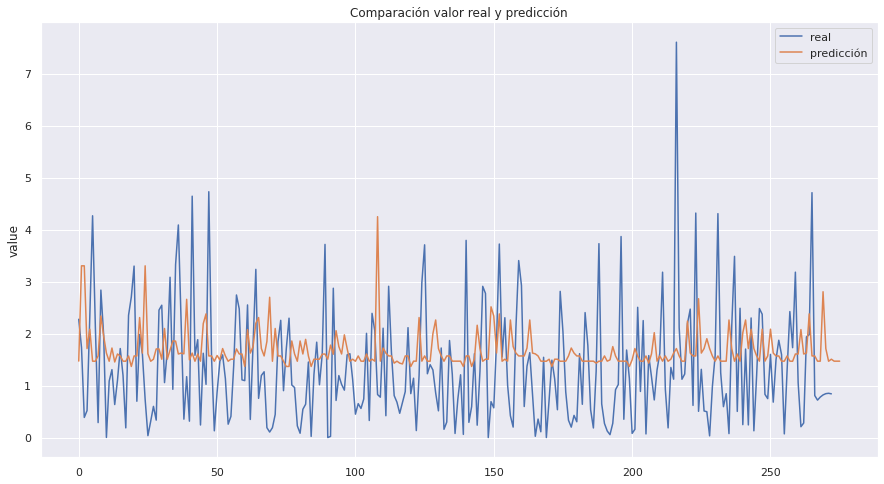

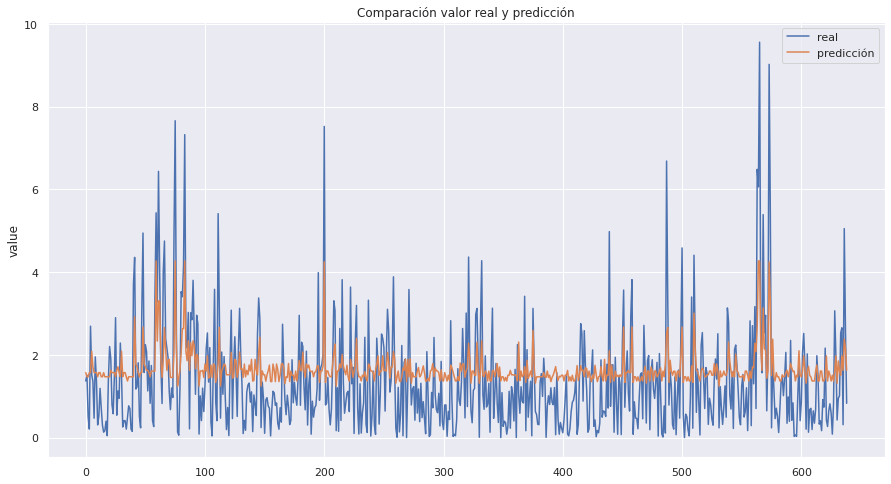

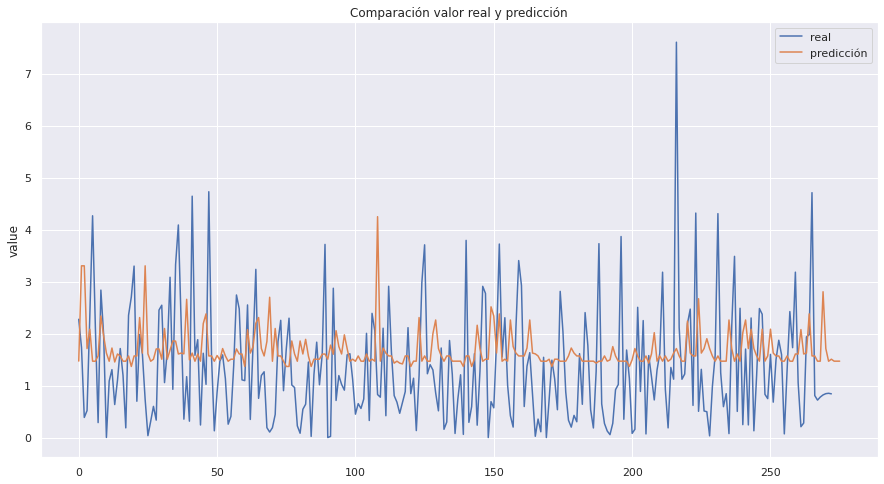

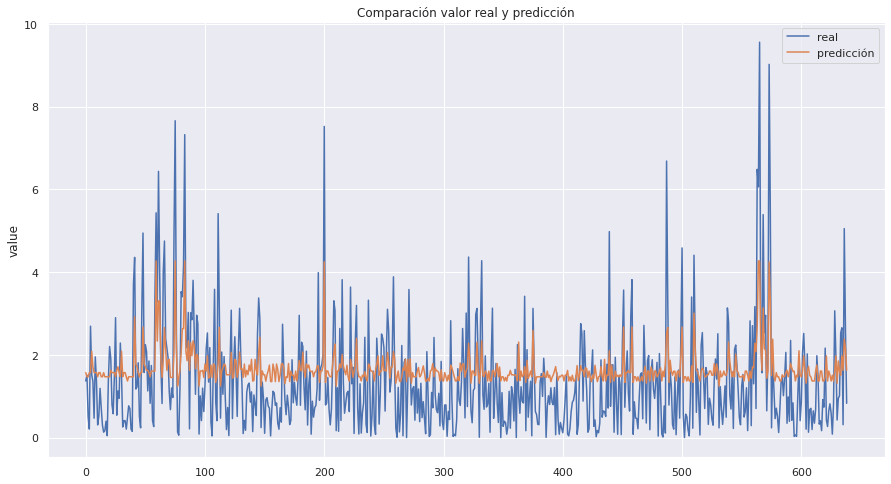

...

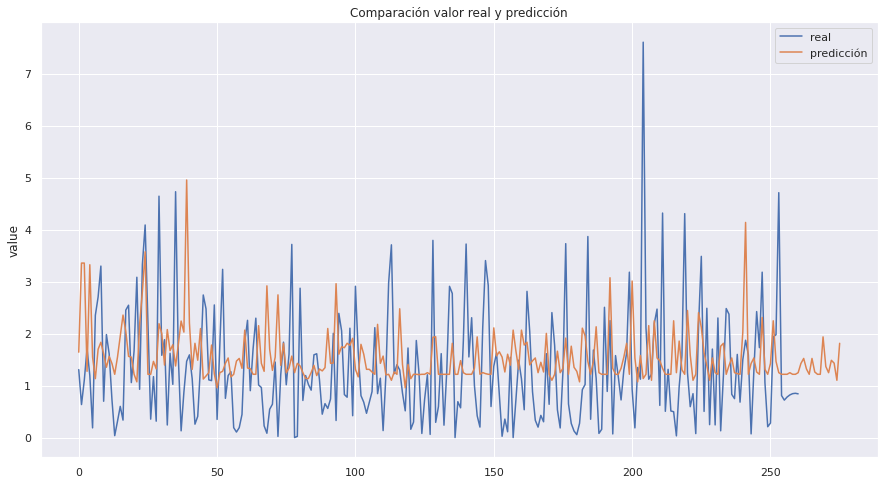

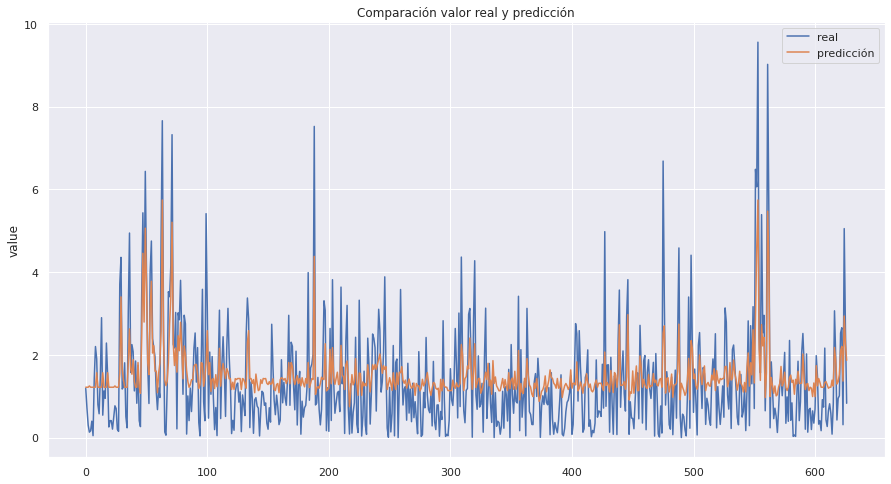

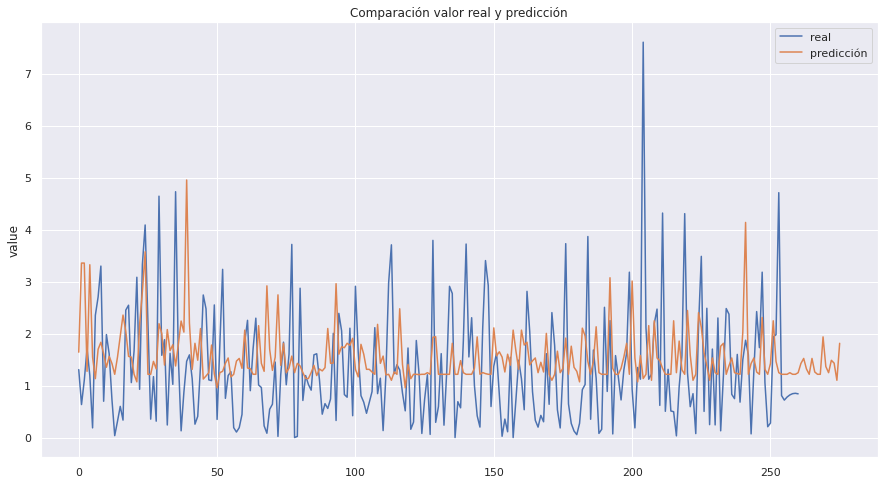

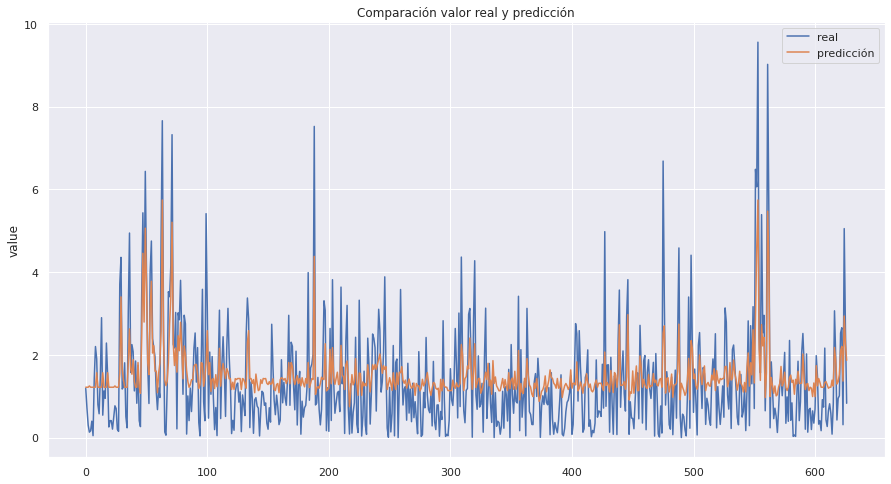

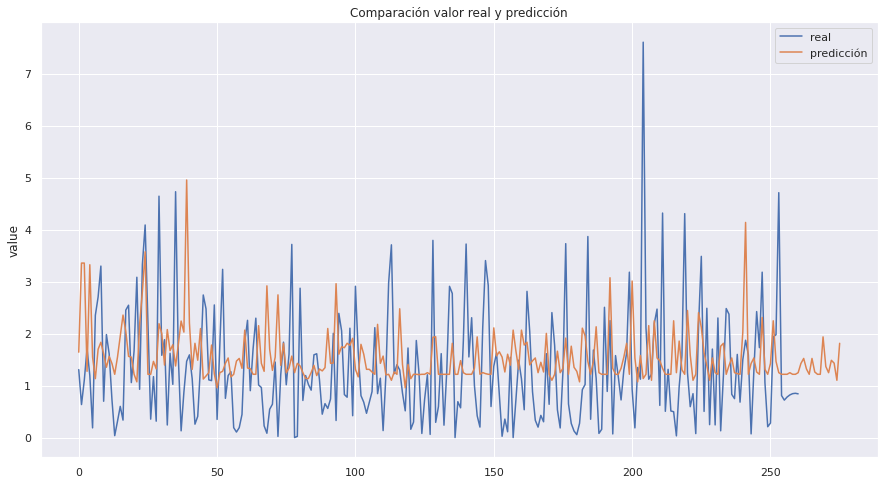

In [12]:
lags=[3,5,7,8,10,15]
n_estimators=[i for i in range(50,100,10)]
n_estimators.extend([200,300,500])
results_models={i:{} for i in lags}
for lg in lags:
    for est in n_estimators:
        results_models[lg][est]=Model(df_data.copy(),df_label.copy(),lg,est)